<a href="https://colab.research.google.com/github/NataSamo/Python-ML/blob/main/Clust4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from google.colab import files

In [ ]:
sns.set()

In [ ]:
files.upload()
data = pd.read_csv('data.csv')
data.head()

Saving data.csv to data.csv


,index,title,genre,summary
0,0,Drowned Wednesday,fantasy,Drowned Wednesday is the first Trustee among ...
1,1,The Lost Hero,fantasy,"As the book opens, Jason awakens on a school ..."
2,2,The Eyes of the Overworld,fantasy,Cugel is easily persuaded by the merchant Fia...
3,3,Magic's Promise,fantasy,The book opens with Herald-Mage Vanyel return...
4,4,Taran Wanderer,fantasy,Taran and Gurgi have returned to Caer Dallben...


In [ ]:
data.describe()

,index
count,4657.000000
mean,2328.000000
std,1344.504432
min,0.000000
25%,1164.000000
50%,2328.000000
75%,3492.000000
max,4656.000000


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4657 entries, 0 to 4656
Data columns (total 4 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   index    4657 non-null   int64 
 1   title    4657 non-null   object
 2   genre    4657 non-null   object
 3   summary  4657 non-null   object
dtypes: int64(1), object(3)
memory usage: 145.7+ KB


In [ ]:
data.describe(include=['O'])

,title,genre,summary
count,4657,4657,4657
unique,4296,10,4542
top,Bloodline,thriller,The incredible true story of the women who fou...
freq,4,1023,3


In [ ]:
data.isnull().sum()

,0
index,0
title,0
genre,0
summary,0


In [ ]:
nan_data = data.columns[data.isnull().any()]
nan_data

Index([], dtype='object')

In [ ]:
dup_data = data[data.duplicated()]
dup_data

,title,genre,summary
3038,The Radium Girls: The Dark Story of America's ...,history,The incredible true story of the women who fou...
3624,A Lie for a Lie,sports,From the New York Times bestselling author of ...
3625,Rookie Move,sports,The first novel in a sexy new series featuring...
3626,The Raven King,sports,"The Foxes are a fractured mess, but their late..."
3627,The King's Men,sports,Neil Josten is out of time. He knew when he ca...
3628,The Play,sports,A brand-new standalone novel in the New York T...
3629,Hands Down,sports,"Before he was Big Texas, he was Zac the Snack ..."
3630,Taking a Shot,sports,"If you want to score, you have to get in the g..."
3631,What I Talk About When I Talk About Running,sports,"In 1982, having sold his jazz bar to devote hi..."
3632,Changing the Game,sports,Sports agent Liz Darnell will do anything to w...


In [ ]:
data = data.drop_duplicates()

In [ ]:
dup_data = data[data.duplicated()]
dup_data

,title,genre,summary


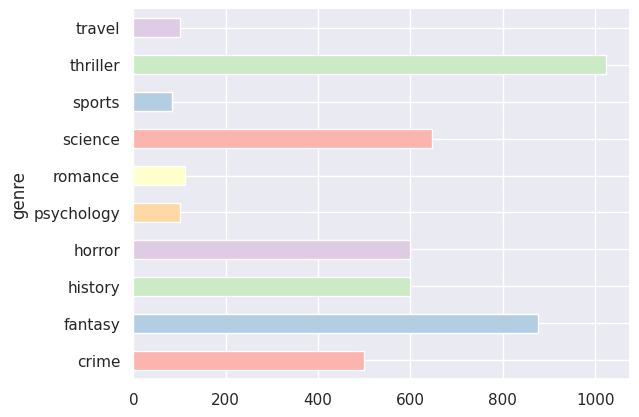

In [ ]:
data.groupby('genre').size().plot(kind='barh', color=sns.palettes.mpl_palette('Pastel1'))
plt.gca().spines[['top', 'right',]].set_visible(False)

In [ ]:
data.drop(columns=['index'], inplace=True)
data

,title,genre,summary
0,Drowned Wednesday,fantasy,Drowned Wednesday is the first Trustee among ...
1,The Lost Hero,fantasy,"As the book opens, Jason awakens on a school ..."
2,The Eyes of the Overworld,fantasy,Cugel is easily persuaded by the merchant Fia...
3,Magic's Promise,fantasy,The book opens with Herald-Mage Vanyel return...
4,Taran Wanderer,fantasy,Taran and Gurgi have returned to Caer Dallben...
...,...,...,...
4652,Hounded,fantasy,"Atticus O’Sullivan, last of the Druids, lives ..."
4653,Charlie and the Chocolate Factory,fantasy,Charlie Bucket's wonderful adventure begins wh...
4654,Red Rising,fantasy,"""I live for the dream that my children will be..."
4655,Frostbite,fantasy,"Rose loves Dimitri, Dimitri might love Tasha, ..."


In [ ]:
length = data['summary'].str.len()
print(length)

0       4704
1       3127
2       1953
3       4598
4       6743
        ... 
4652     890
4653     249
4654    1371
4655     983
4656    1094
Name: summary, Length: 4640, dtype: int64


In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

In [ ]:
from copy import deepcopy

In [ ]:
data_CV = data.copy()
data_CV

,title,genre,summary
0,Drowned Wednesday,fantasy,Drowned Wednesday is the first Trustee among ...
1,The Lost Hero,fantasy,"As the book opens, Jason awakens on a school ..."
2,The Eyes of the Overworld,fantasy,Cugel is easily persuaded by the merchant Fia...
3,Magic's Promise,fantasy,The book opens with Herald-Mage Vanyel return...
4,Taran Wanderer,fantasy,Taran and Gurgi have returned to Caer Dallben...
...,...,...,...
4652,Hounded,fantasy,"Atticus O’Sullivan, last of the Druids, lives ..."
4653,Charlie and the Chocolate Factory,fantasy,Charlie Bucket's wonderful adventure begins wh...
4654,Red Rising,fantasy,"""I live for the dream that my children will be..."
4655,Frostbite,fantasy,"Rose loves Dimitri, Dimitri might love Tasha, ..."


In [ ]:
count_vect = CountVectorizer(stop_words='english')
data_CV_counts = count_vect.fit_transform(data_CV['summary'])
data_CV_counts.shape

(4657, 55348)

In [ ]:
from sklearn.cluster import KMeans

In [ ]:
kmeans = KMeans(n_clusters=10, random_state=42)
kmeans.fit(data_CV_counts)
data_CV['cluster'] = kmeans.labels_
data_CV

,title,genre,summary,cluster
0,Drowned Wednesday,fantasy,Drowned Wednesday is the first Trustee among ...,3
1,The Lost Hero,fantasy,"As the book opens, Jason awakens on a school ...",9
2,The Eyes of the Overworld,fantasy,Cugel is easily persuaded by the merchant Fia...,9
3,Magic's Promise,fantasy,The book opens with Herald-Mage Vanyel return...,3
4,Taran Wanderer,fantasy,Taran and Gurgi have returned to Caer Dallben...,3
...,...,...,...,...
4652,Hounded,fantasy,"Atticus O’Sullivan, last of the Druids, lives ...",9
4653,Charlie and the Chocolate Factory,fantasy,Charlie Bucket's wonderful adventure begins wh...,9
4654,Red Rising,fantasy,"""I live for the dream that my children will be...",9
4655,Frostbite,fantasy,"Rose loves Dimitri, Dimitri might love Tasha, ...",9


In [ ]:

cluster0_CV = data_CV[data_CV['cluster'] == 0]['genre']
cluster1_CV = data_CV[data_CV['cluster'] == 1]['genre']
cluster2_CV = data_CV[data_CV['cluster'] == 2]['genre']
cluster3_CV = data_CV[data_CV['cluster'] == 3]['genre']
cluster4_CV = data_CV[data_CV['cluster'] == 4]['genre']
cluster5_CV = data_CV[data_CV['cluster'] == 5]['genre']
cluster6_CV = data_CV[data_CV['cluster'] == 6]['genre']
cluster7_CV = data_CV[data_CV['cluster'] == 7]['genre']
cluster8_CV = data_CV[data_CV['cluster'] == 8]['genre']
cluster9_CV = data_CV[data_CV['cluster'] == 9]['genre']

In [ ]:
from wordcloud import WordCloud

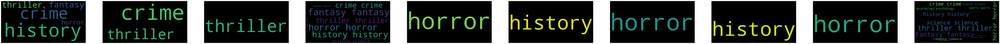

In [ ]:

word_lists = [cluster0_CV, cluster1_CV, cluster2_CV, cluster3_CV, cluster4_CV, cluster5_CV, cluster6_CV, cluster7_CV, cluster8_CV, cluster9_CV]


fig, axs = plt.subplots(1, len(word_lists), figsize=(120, 10))
for i, word_list in enumerate(word_lists):
    wordcloud = WordCloud(width=400, height=200).generate(' '.join(word_list))
    axs[i].imshow(wordcloud, interpolation='bilinear')
    axs[i].axis('off')

plt.show()

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [ ]:
data_tfidf = data.copy()

In [ ]:
tfidf_vect = TfidfVectorizer(stop_words='english')
data_tfidf_train = tfidf_vect.fit_transform(data_tfidf['summary'])
data_tfidf_train.shape

(4640, 55348)

In [ ]:
kmeans1 = KMeans(n_clusters=10, random_state=42)
kmeans1.fit(data_tfidf_train)
data_tfidf['cluster'] = kmeans1.labels_
data_tfidf

,title,genre,summary,cluster
0,Drowned Wednesday,fantasy,Drowned Wednesday is the first Trustee among ...,0
1,The Lost Hero,fantasy,"As the book opens, Jason awakens on a school ...",0
2,The Eyes of the Overworld,fantasy,Cugel is easily persuaded by the merchant Fia...,4
3,Magic's Promise,fantasy,The book opens with Herald-Mage Vanyel return...,0
4,Taran Wanderer,fantasy,Taran and Gurgi have returned to Caer Dallben...,6
...,...,...,...,...
4652,Hounded,fantasy,"Atticus O’Sullivan, last of the Druids, lives ...",9
4653,Charlie and the Chocolate Factory,fantasy,Charlie Bucket's wonderful adventure begins wh...,7
4654,Red Rising,fantasy,"""I live for the dream that my children will be...",1
4655,Frostbite,fantasy,"Rose loves Dimitri, Dimitri might love Tasha, ...",0


In [ ]:
cluster0 = data_tfidf[data_tfidf['cluster'] == 0]['genre']
cluster1 = data_tfidf[data_tfidf['cluster'] == 1]['genre']
cluster2 = data_tfidf[data_tfidf['cluster'] == 2]['genre']
cluster3 = data_tfidf[data_tfidf['cluster'] == 3]['genre']
cluster4 = data_tfidf[data_tfidf['cluster'] == 4]['genre']
cluster5 = data_tfidf[data_tfidf['cluster'] == 5]['genre']
cluster6 = data_tfidf[data_tfidf['cluster'] == 6]['genre']
cluster7 = data_tfidf[data_tfidf['cluster'] == 7]['genre']
cluster8 = data_tfidf[data_tfidf['cluster'] == 8]['genre']
cluster9 = data_tfidf[data_tfidf['cluster'] == 9]['genre']

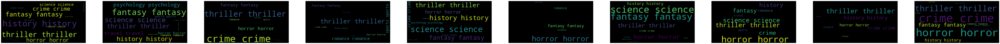

In [ ]:
word_lists = [cluster0, cluster1, cluster2, cluster3, cluster4, cluster5, cluster6, cluster7, cluster8, cluster9]


fig, axs = plt.subplots(1, len(word_lists), figsize=(120, 10))
for i, word_list in enumerate(word_lists):
    wordcloud = WordCloud(width=400, height=200).generate(' '.join(word_list))
    axs[i].imshow(wordcloud, interpolation='bilinear')
    axs[i].axis('off')

plt.show()

In [ ]:
kmeans7 = KMeans(n_clusters=7, random_state=42)
kmeans7.fit(data_CV_counts)
data_CV['cluster7'] = kmeans7.labels_
data_CV

,title,genre,summary,cluster7
0,Drowned Wednesday,fantasy,Drowned Wednesday is the first Trustee among ...,1
1,The Lost Hero,fantasy,"As the book opens, Jason awakens on a school ...",4
2,The Eyes of the Overworld,fantasy,Cugel is easily persuaded by the merchant Fia...,4
3,Magic's Promise,fantasy,The book opens with Herald-Mage Vanyel return...,4
4,Taran Wanderer,fantasy,Taran and Gurgi have returned to Caer Dallben...,1
...,...,...,...,...
4652,Hounded,fantasy,"Atticus O’Sullivan, last of the Druids, lives ...",4
4653,Charlie and the Chocolate Factory,fantasy,Charlie Bucket's wonderful adventure begins wh...,4
4654,Red Rising,fantasy,"""I live for the dream that my children will be...",4
4655,Frostbite,fantasy,"Rose loves Dimitri, Dimitri might love Tasha, ...",4


In [ ]:

cluster0_CV = data_CV[data_CV['cluster7'] == 0]['genre']
cluster1_CV = data_CV[data_CV['cluster7'] == 1]['genre']
cluster2_CV = data_CV[data_CV['cluster7'] == 2]['genre']
cluster3_CV = data_CV[data_CV['cluster7'] == 3]['genre']
cluster4_CV = data_CV[data_CV['cluster7'] == 4]['genre']
cluster5_CV = data_CV[data_CV['cluster7'] == 5]['genre']
cluster6_CV = data_CV[data_CV['cluster7'] == 6]['genre']


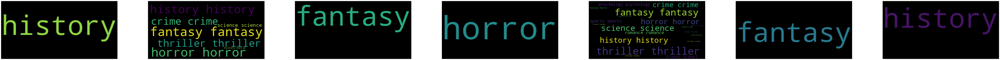

In [ ]:

word_lists = [cluster0_CV, cluster1_CV, cluster2_CV, cluster3_CV, cluster4_CV, cluster5_CV, cluster6_CV]


fig, axs = plt.subplots(1, len(word_lists), figsize=(120, 7))
for i, word_list in enumerate(word_lists):
    wordcloud = WordCloud(width=400, height=200).generate(' '.join(word_list))
    axs[i].imshow(wordcloud, interpolation='bilinear')
    axs[i].axis('off')

plt.show()

In [ ]:
kmeans5 = KMeans(n_clusters=5, random_state=42)
kmeans5.fit(data_CV_counts)
data_CV['cluster5'] = kmeans5.labels_
data_CV

,title,genre,summary,cluster7,cluster5
0,Drowned Wednesday,fantasy,Drowned Wednesday is the first Trustee among ...,1,1
1,The Lost Hero,fantasy,"As the book opens, Jason awakens on a school ...",4,4
2,The Eyes of the Overworld,fantasy,Cugel is easily persuaded by the merchant Fia...,4,4
3,Magic's Promise,fantasy,The book opens with Herald-Mage Vanyel return...,4,4
4,Taran Wanderer,fantasy,Taran and Gurgi have returned to Caer Dallben...,1,1
...,...,...,...,...,...
4652,Hounded,fantasy,"Atticus O’Sullivan, last of the Druids, lives ...",4,4
4653,Charlie and the Chocolate Factory,fantasy,Charlie Bucket's wonderful adventure begins wh...,4,4
4654,Red Rising,fantasy,"""I live for the dream that my children will be...",4,4
4655,Frostbite,fantasy,"Rose loves Dimitri, Dimitri might love Tasha, ...",4,4


In [ ]:

cluster0_CV = data_CV[data_CV['cluster7'] == 0]['genre']
cluster1_CV = data_CV[data_CV['cluster7'] == 1]['genre']
cluster2_CV = data_CV[data_CV['cluster7'] == 2]['genre']
cluster3_CV = data_CV[data_CV['cluster7'] == 3]['genre']
cluster4_CV = data_CV[data_CV['cluster7'] == 4]['genre']



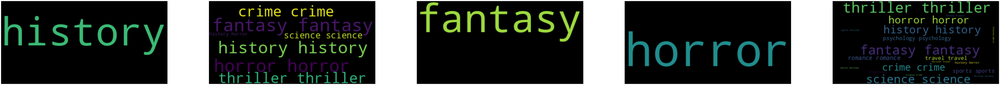

In [ ]:

word_lists = [cluster0_CV, cluster1_CV, cluster2_CV, cluster3_CV, cluster4_CV]


fig, axs = plt.subplots(1, len(word_lists), figsize=(120, 10))
for i, word_list in enumerate(word_lists):
    wordcloud = WordCloud(width=400, height=200).generate(' '.join(word_list))
    axs[i].imshow(wordcloud, interpolation='bilinear')
    axs[i].axis('off')

plt.show()

In [ ]:
count = data[data['genre'] == 'psychology'].shape[0]
count

100

In [ ]:
genre_counts = data['genre'].value_counts()
new_data = pd.DataFrame()
for genre in genre_counts.index:
    genre_data = data[data['genre'] == genre].sample(n=100, random_state=42)
    new_data = pd.concat([new_data, genre_data], ignore_index=True)

In [ ]:
new_data

,title,genre,summary
0,Jurassic Park,thriller,An astonishing technique for recovering and cl...
1,Empire of Lies,thriller,The book is a thriller in which the protagoni...
2,The Gun Seller,thriller,The Gun Seller tells the story of retired Arm...
3,Cemetery Dance,thriller,Pendergast returns to NYC in New York Times b...
4,Jar of Hearts,thriller,This is the story of three best friends: one w...
...,...,...,...
995,Zen and the Art of Motorcycle Maintenance: An ...,travel,Robert M. Pirsig's Zen & the Art of Motorcycle...
996,Between the Woods and the Water,travel,Continuing the epic foot journey across Europe...
997,The Great Railway Bazaar,travel,"First published in 1975, Paul Theroux's strang..."
998,Lands of Lost Borders: Out of Bounds on the Si...,travel,"""Every day on a bike trip is like the one befo..."


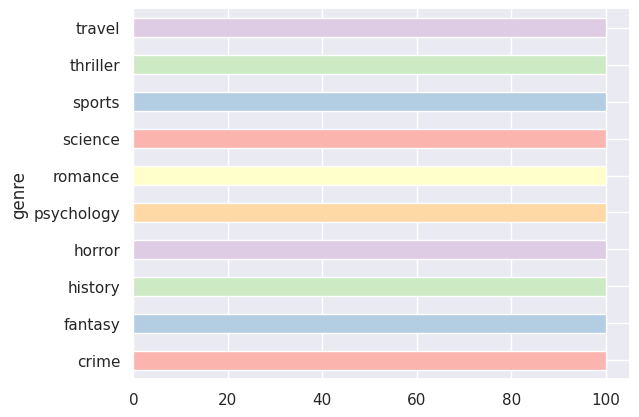

In [ ]:
new_data.groupby('genre').size().plot(kind='barh', color=sns.palettes.mpl_palette('Pastel1'))
plt.gca().spines[['top', 'right',]].set_visible(False)

In [ ]:
count_vect = CountVectorizer(stop_words='english')
new_data_CV_counts = count_vect.fit_transform(new_data['summary'])
new_data_CV_counts.shape

(1000, 23545)

In [ ]:
kmeans10 = KMeans(n_clusters=10, random_state=42)
kmeans10.fit(new_data_CV_counts)
new_data['cluster10'] = kmeans10.labels_
new_data

,title,genre,summary,cluster10
0,Jurassic Park,thriller,An astonishing technique for recovering and cl...,1
1,Empire of Lies,thriller,The book is a thriller in which the protagoni...,1
2,The Gun Seller,thriller,The Gun Seller tells the story of retired Arm...,1
3,Cemetery Dance,thriller,Pendergast returns to NYC in New York Times b...,1
4,Jar of Hearts,thriller,This is the story of three best friends: one w...,1
...,...,...,...,...
995,Zen and the Art of Motorcycle Maintenance: An ...,travel,Robert M. Pirsig's Zen & the Art of Motorcycle...,1
996,Between the Woods and the Water,travel,Continuing the epic foot journey across Europe...,1
997,The Great Railway Bazaar,travel,"First published in 1975, Paul Theroux's strang...",1
998,Lands of Lost Borders: Out of Bounds on the Si...,travel,"""Every day on a bike trip is like the one befo...",1


In [ ]:

cluster0_CV = new_data[new_data['cluster10'] == 0]['genre']
cluster1_CV = new_data[new_data['cluster10'] == 1]['genre']
cluster2_CV = new_data[new_data['cluster10'] == 2]['genre']
cluster3_CV = new_data[new_data['cluster10'] == 3]['genre']
cluster4_CV = new_data[new_data['cluster10'] == 4]['genre']
cluster5_CV = new_data[new_data['cluster10'] == 5]['genre']
cluster6_CV = new_data[new_data['cluster10'] == 6]['genre']
cluster7_CV = new_data[new_data['cluster10'] == 7]['genre']
cluster8_CV = new_data[new_data['cluster10'] == 8]['genre']
cluster9_CV = new_data[new_data['cluster10'] == 9]['genre']

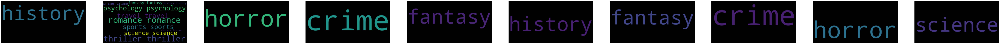

In [ ]:

word_lists = [cluster0_CV, cluster1_CV, cluster2_CV, cluster3_CV, cluster4_CV, cluster5_CV, cluster6_CV, cluster7_CV, cluster8_CV, cluster9_CV]


fig, axs = plt.subplots(1, len(word_lists), figsize=(120, 10))
for i, word_list in enumerate(word_lists):
    wordcloud = WordCloud(width=400, height=200).generate(' '.join(word_list))
    axs[i].imshow(wordcloud, interpolation='bilinear')
    axs[i].axis('off')

plt.show()

In [ ]:
kmeans5 = KMeans(n_clusters=5, random_state=42)
kmeans5.fit(new_data_CV_counts)
new_data['cluster5'] = kmeans5.labels_
new_data

,title,genre,summary,cluster10,cluster5
0,Jurassic Park,thriller,An astonishing technique for recovering and cl...,1,4
1,Empire of Lies,thriller,The book is a thriller in which the protagoni...,1,4
2,The Gun Seller,thriller,The Gun Seller tells the story of retired Arm...,1,4
3,Cemetery Dance,thriller,Pendergast returns to NYC in New York Times b...,1,4
4,Jar of Hearts,thriller,This is the story of three best friends: one w...,1,4
...,...,...,...,...,...
995,Zen and the Art of Motorcycle Maintenance: An ...,travel,Robert M. Pirsig's Zen & the Art of Motorcycle...,1,4
996,Between the Woods and the Water,travel,Continuing the epic foot journey across Europe...,1,4
997,The Great Railway Bazaar,travel,"First published in 1975, Paul Theroux's strang...",1,4
998,Lands of Lost Borders: Out of Bounds on the Si...,travel,"""Every day on a bike trip is like the one befo...",1,4


In [ ]:

cluster0_CV = new_data[new_data['cluster5'] == 0]['genre']
cluster1_CV = new_data[new_data['cluster5'] == 1]['genre']
cluster2_CV = new_data[new_data['cluster5'] == 2]['genre']
cluster3_CV = new_data[new_data['cluster5'] == 3]['genre']
cluster4_CV = new_data[new_data['cluster5'] == 4]['genre']



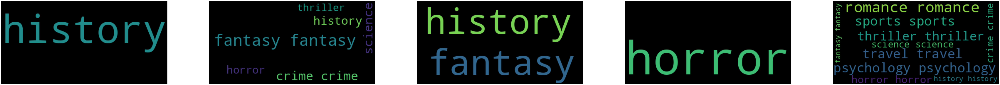

In [ ]:

word_lists = [cluster0_CV, cluster1_CV, cluster2_CV, cluster3_CV, cluster4_CV]


fig, axs = plt.subplots(1, len(word_lists), figsize=(120, 10))
for i, word_list in enumerate(word_lists):
    wordcloud = WordCloud(width=400, height=200).generate(' '.join(word_list))
    axs[i].imshow(wordcloud, interpolation='bilinear')
    axs[i].axis('off')

plt.show()

In [ ]:
kmeans3 = KMeans(n_clusters=3, random_state=42)
kmeans3.fit(new_data_CV_counts)
new_data['cluster3'] = kmeans3.labels_
new_data

,title,genre,summary,cluster10,cluster5,cluster3
0,Jurassic Park,thriller,An astonishing technique for recovering and cl...,1,4,1
1,Empire of Lies,thriller,The book is a thriller in which the protagoni...,1,4,1
2,The Gun Seller,thriller,The Gun Seller tells the story of retired Arm...,1,4,1
3,Cemetery Dance,thriller,Pendergast returns to NYC in New York Times b...,1,4,1
4,Jar of Hearts,thriller,This is the story of three best friends: one w...,1,4,1
...,...,...,...,...,...,...
995,Zen and the Art of Motorcycle Maintenance: An ...,travel,Robert M. Pirsig's Zen & the Art of Motorcycle...,1,4,1
996,Between the Woods and the Water,travel,Continuing the epic foot journey across Europe...,1,4,1
997,The Great Railway Bazaar,travel,"First published in 1975, Paul Theroux's strang...",1,4,1
998,Lands of Lost Borders: Out of Bounds on the Si...,travel,"""Every day on a bike trip is like the one befo...",1,4,1


In [ ]:

cluster0_CV = new_data[new_data['cluster3'] == 0]['genre']
cluster1_CV = new_data[new_data['cluster3'] == 1]['genre']
cluster2_CV = new_data[new_data['cluster3'] == 2]['genre']




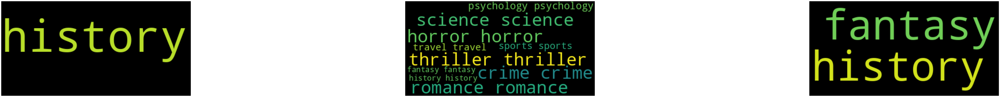

In [ ]:

word_lists = [cluster0_CV, cluster1_CV, cluster2_CV]


fig, axs = plt.subplots(1, len(word_lists), figsize=(120, 10))
for i, word_list in enumerate(word_lists):
    wordcloud = WordCloud(width=400, height=200).generate(' '.join(word_list))
    axs[i].imshow(wordcloud, interpolation='bilinear')
    axs[i].axis('off')

plt.show()

In [ ]:
kmeans6 = KMeans(n_clusters=6, random_state=42)
kmeans6.fit(new_data_CV_counts)
new_data['cluster6'] = kmeans6.labels_
new_data

,title,genre,summary,cluster10,cluster5,cluster3,cluster6
0,Jurassic Park,thriller,An astonishing technique for recovering and cl...,1,4,1,4
1,Empire of Lies,thriller,The book is a thriller in which the protagoni...,1,4,1,4
2,The Gun Seller,thriller,The Gun Seller tells the story of retired Arm...,1,4,1,4
3,Cemetery Dance,thriller,Pendergast returns to NYC in New York Times b...,1,4,1,4
4,Jar of Hearts,thriller,This is the story of three best friends: one w...,1,4,1,4
...,...,...,...,...,...,...,...
995,Zen and the Art of Motorcycle Maintenance: An ...,travel,Robert M. Pirsig's Zen & the Art of Motorcycle...,1,4,1,4
996,Between the Woods and the Water,travel,Continuing the epic foot journey across Europe...,1,4,1,4
997,The Great Railway Bazaar,travel,"First published in 1975, Paul Theroux's strang...",1,4,1,4
998,Lands of Lost Borders: Out of Bounds on the Si...,travel,"""Every day on a bike trip is like the one befo...",1,4,1,4


In [ ]:

cluster0_CV = new_data[new_data['cluster6'] == 0]['genre']
cluster1_CV = new_data[new_data['cluster6'] == 1]['genre']
cluster2_CV = new_data[new_data['cluster6'] == 2]['genre']
cluster3_CV = new_data[new_data['cluster6'] == 3]['genre']
cluster4_CV = new_data[new_data['cluster6'] == 4]['genre']
cluster5_CV = new_data[new_data['cluster6'] == 5]['genre']


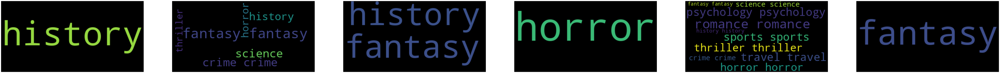

In [ ]:

word_lists = [cluster0_CV, cluster1_CV, cluster2_CV, cluster3_CV, cluster4_CV, cluster5_CV]


fig, axs = plt.subplots(1, len(word_lists), figsize=(120, 10))
for i, word_list in enumerate(word_lists):
    wordcloud = WordCloud(width=400, height=200).generate(' '.join(word_list))
    axs[i].imshow(wordcloud, interpolation='bilinear')
    axs[i].axis('off')

plt.show()

In [ ]:
kmeans7 = KMeans(n_clusters=7, random_state=42)
kmeans7.fit(new_data_CV_counts)
new_data['cluster7'] = kmeans7.labels_
new_data

,title,genre,summary,cluster10,cluster5,cluster3,cluster6,cluster7
0,Jurassic Park,thriller,An astonishing technique for recovering and cl...,1,4,1,4,4
1,Empire of Lies,thriller,The book is a thriller in which the protagoni...,1,4,1,4,4
2,The Gun Seller,thriller,The Gun Seller tells the story of retired Arm...,1,4,1,4,4
3,Cemetery Dance,thriller,Pendergast returns to NYC in New York Times b...,1,4,1,4,4
4,Jar of Hearts,thriller,This is the story of three best friends: one w...,1,4,1,4,4
...,...,...,...,...,...,...,...,...
995,Zen and the Art of Motorcycle Maintenance: An ...,travel,Robert M. Pirsig's Zen & the Art of Motorcycle...,1,4,1,4,4
996,Between the Woods and the Water,travel,Continuing the epic foot journey across Europe...,1,4,1,4,4
997,The Great Railway Bazaar,travel,"First published in 1975, Paul Theroux's strang...",1,4,1,4,4
998,Lands of Lost Borders: Out of Bounds on the Si...,travel,"""Every day on a bike trip is like the one befo...",1,4,1,4,4


In [ ]:

cluster0_CV = new_data[new_data['cluster7'] == 0]['genre']
cluster1_CV = new_data[new_data['cluster7'] == 1]['genre']
cluster2_CV = new_data[new_data['cluster7'] == 2]['genre']
cluster3_CV = new_data[new_data['cluster7'] == 3]['genre']
cluster4_CV = new_data[new_data['cluster7'] == 4]['genre']
cluster5_CV = new_data[new_data['cluster7'] == 5]['genre']
cluster6_CV = new_data[new_data['cluster7'] == 6]['genre']

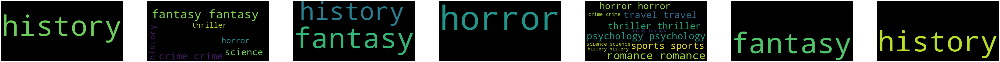

In [ ]:

word_lists = [cluster0_CV, cluster1_CV, cluster2_CV, cluster3_CV, cluster4_CV, cluster5_CV, cluster6_CV]


fig, axs = plt.subplots(1, len(word_lists), figsize=(120, 10))
for i, word_list in enumerate(word_lists):
    wordcloud = WordCloud(width=400, height=200).generate(' '.join(word_list))
    axs[i].imshow(wordcloud, interpolation='bilinear')
    axs[i].axis('off')

plt.show()

In [ ]:
kmeans8 = KMeans(n_clusters=8, random_state=42)
kmeans8.fit(new_data_CV_counts)
new_data['cluster8'] = kmeans8.labels_
new_data

,title,genre,summary,cluster10,cluster5,cluster3,cluster6,cluster7,cluster8
0,Jurassic Park,thriller,An astonishing technique for recovering and cl...,1,4,1,4,4,1
1,Empire of Lies,thriller,The book is a thriller in which the protagoni...,1,4,1,4,4,1
2,The Gun Seller,thriller,The Gun Seller tells the story of retired Arm...,1,4,1,4,4,1
3,Cemetery Dance,thriller,Pendergast returns to NYC in New York Times b...,1,4,1,4,4,1
4,Jar of Hearts,thriller,This is the story of three best friends: one w...,1,4,1,4,4,1
...,...,...,...,...,...,...,...,...,...
995,Zen and the Art of Motorcycle Maintenance: An ...,travel,Robert M. Pirsig's Zen & the Art of Motorcycle...,1,4,1,4,4,1
996,Between the Woods and the Water,travel,Continuing the epic foot journey across Europe...,1,4,1,4,4,1
997,The Great Railway Bazaar,travel,"First published in 1975, Paul Theroux's strang...",1,4,1,4,4,1
998,Lands of Lost Borders: Out of Bounds on the Si...,travel,"""Every day on a bike trip is like the one befo...",1,4,1,4,4,1


In [ ]:

cluster0_CV = new_data[new_data['cluster8'] == 0]['genre']
cluster1_CV = new_data[new_data['cluster8'] == 1]['genre']
cluster2_CV = new_data[new_data['cluster8'] == 2]['genre']
cluster3_CV = new_data[new_data['cluster8'] == 3]['genre']
cluster4_CV = new_data[new_data['cluster8'] == 4]['genre']
cluster5_CV = new_data[new_data['cluster8'] == 5]['genre']
cluster6_CV = new_data[new_data['cluster8'] == 6]['genre']
cluster7_CV = new_data[new_data['cluster8'] == 7]['genre']

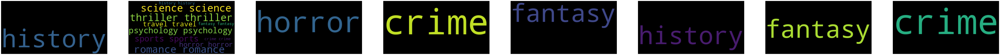

In [ ]:

word_lists = [cluster0_CV, cluster1_CV, cluster2_CV, cluster3_CV, cluster4_CV, cluster5_CV, cluster6_CV, cluster7_CV]


fig, axs = plt.subplots(1, len(word_lists), figsize=(120, 10))
for i, word_list in enumerate(word_lists):
    wordcloud = WordCloud(width=400, height=200).generate(' '.join(word_list))
    axs[i].imshow(wordcloud, interpolation='bilinear')
    axs[i].axis('off')

plt.show()

In [ ]:
kmeans2 = KMeans(n_clusters=2, random_state=42)
kmeans2.fit(new_data_CV_counts)
new_data['cluster2'] = kmeans2.labels_
new_data

,title,genre,summary,cluster10,cluster5,cluster3,cluster6,cluster7,cluster8,cluster2
0,Jurassic Park,thriller,An astonishing technique for recovering and cl...,1,4,1,4,4,1,1
1,Empire of Lies,thriller,The book is a thriller in which the protagoni...,1,4,1,4,4,1,1
2,The Gun Seller,thriller,The Gun Seller tells the story of retired Arm...,1,4,1,4,4,1,1
3,Cemetery Dance,thriller,Pendergast returns to NYC in New York Times b...,1,4,1,4,4,1,1
4,Jar of Hearts,thriller,This is the story of three best friends: one w...,1,4,1,4,4,1,1
...,...,...,...,...,...,...,...,...,...,...
995,Zen and the Art of Motorcycle Maintenance: An ...,travel,Robert M. Pirsig's Zen & the Art of Motorcycle...,1,4,1,4,4,1,1
996,Between the Woods and the Water,travel,Continuing the epic foot journey across Europe...,1,4,1,4,4,1,1
997,The Great Railway Bazaar,travel,"First published in 1975, Paul Theroux's strang...",1,4,1,4,4,1,1
998,Lands of Lost Borders: Out of Bounds on the Si...,travel,"""Every day on a bike trip is like the one befo...",1,4,1,4,4,1,1


In [ ]:

cluster0_CV = new_data[new_data['cluster2'] == 0]['genre']
cluster1_CV = new_data[new_data['cluster2'] == 1]['genre']

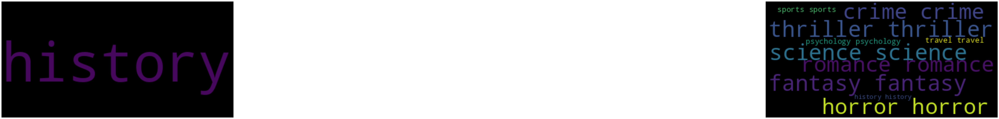

In [ ]:

word_lists = [cluster0_CV, cluster1_CV]


fig, axs = plt.subplots(1, len(word_lists), figsize=(120, 10))
for i, word_list in enumerate(word_lists):
    wordcloud = WordCloud(width=400, height=200).generate(' '.join(word_list))
    axs[i].imshow(wordcloud, interpolation='bilinear')
    axs[i].axis('off')

plt.show()